## Project 3
## Name: Harries, Robathan Tobias Bonnell
## Date submitted: 27 May
## Score: 19/20

[A] 3/3

[B] 2/2

[C] 7/8

[D] 1/1

[E] 1/1

[F] 1/1

[G] 3/3

[H] 1/1

#### Comments: 
Good job!

[C] For $T=1.8$, it seems to not have reached equilibrium. At equilibrium, it should be all spins pointing in the same direction, except for a few spins.

## Rubric
Code Tests

[A] (3 pts) If code tests are suggested, all such tests are completed.  If code tests aren’t suggested, student has articulated their own code tests and executed those tests to show that code is working properly in at least some small number of obvious cases.  The more robust the code tests are, the better.

The more of these tests done, the better:
- Correct analytical value for the expected earnings per roll.
- Demonstration that the MCMC function obtains this value, using an appropriate metric for comparison.
- A histogram of numbers obtained over `num_steps` number of die rolls.
- [Optional] Has figured out the minimum `num_steps` required in order for the MCMC simulation to converge.

[B] (2 pts) All code tests are explained in complete sentences in text cells (along with any relevant mathematics).  There is a reasonable amount of explanation of how one knows that the code tests have been passed.

Application of Code to Physical Systems Modeling

[C] (8 pts) Notebook contains a mixture of explanation text in complete sentences (with math where appropriate) and graphs/other visual representations illustrating how the computer model exhibits the relevant phenomena predicted by the mathematical model of the system.  All prompts have been answered.

What I am looking for:

(2)
- For $L=16$ and $L=32$, for some chosen value of $T$, "time series" plots of $M$ and $U$.
- Reasonable value of $t_{eq}$ obtained. Comments about dependence on $L$.

(4)
- $M(T)$ curve for $L=8,16,32,64$, with a sufficient density of temperature points. A sufficiently large value of $t$ must be chosen, and there should be a reasonable matching between the numerical and theoretical plots for $M(t)$

(2)
- For $L=256$, three separate figures corresponding to $T=1.8, 2.3$ and $4.0$.
The plots should qualitatively satisfy:
  - For $T=1.8$, most of the spins must point in the same direction (up or down)
  - For $T=2.3$, a fractal-like picture
  - For $T=4$, a noise-like picture.  



General

[D] (1 pts) The whole notebook can be re-started and re-run without halting due to any coding errors.

[E] (1 pts) The notebook has the correct general structure (code tests placed in the beginning and application of code to analysis of relevant physical systems after).

[F] (1 pts) Flow of notebook is logical, clear, and concise.

[G] (3 pts) Graphical/visual representations are used to concisely illustrate results of code tests and simulations.

[H] (1 pts) All graphs with axes have labels on axes with units and tick marks where appropriate.


# Physics 180N - Project 3

First, I will define the functions weighted_die() and two_dim_ising(), which will be used throughout this notebook to run MCMC simulations detailed in the project specification.

### Crucial Functions

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
import matplotlib
import random
import sys
from google.colab import output
from IPython.display import HTML, display

%matplotlib inline

In [ ]:
# Helper function for clearing logging output from cell output

_LOG_TAG = 'logs'

def clearLogs(id = ""):
  output.clear(output_tags=_LOG_TAG + id)

def log(logStr, id = ""):
  with output.use_tags(_LOG_TAG + id):
    sys.stdout.write(logStr + "\n")
    sys.stdout.flush();

In [ ]:
# Helper function for animating a list of np array images at 2.5 fps

def animate(frames, title):
  fig = plt.figure(figsize=(8,8))
  im = plt.imshow(frames[0], cmap='Greys')
  plt.title(title, size=16)
  
  def update(i):
    im.set_array(frames[i])
    return [im]
  
  anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=400, repeat_delay=1000)

  plt.close()
  display(HTML(anim.to_html5_video()))

In [ ]:
'''
Rolls a weighted 6-sided die num_steps times. If the die lands on 1 or 2, the score is +1; otherwise, the score is -1.
The die is weighted such that sides 1 and 2 are each 3 times as likely as any of the other four equally likely sides.

Args:
    num_steps (int): The number of times to 'roll' the dice.
    
Returns:
    The average score over all num_steps rolls.
'''
def weighted_die(num_steps):
    # accumulates score over all rolls
    total_score = 0
    
    for _ in range(num_steps):
        rand = np.random.uniform()
        
        # 30% chance to land on 1, 30% for 2, 60% chance for +1 score
        if rand < 0.6:
            total_score += 1
        
        # 10% chance for each of 3,4,5,6. 40% chance for -1 score
        else:
            total_score -= 1
            
    return total_score / num_steps

In [ ]:
'''
Objects of this type store the state of an arbitrary sized 2D Ising model. It supports arbitrary numbers of simulation steps, changing temperature and
magnetic field at any time, resetting stored averages and measured time series' (U, M, magSusceptibility, specificHeat), logging statements, and adjusting
the frequency of adding to the measured time series'.
'''
class Ising2D:

  # Initialize a randomized spin state, as well as empty observable time series lists
  def __init__(self, L, temp, H=0, recordRate=1):
    # save state constants
    self.L = L
    self.N = L**2
    
    # state will save to measured value time series' only once every recordRate steps
    self.recordRate = recordRate

    # save adjustable state constants
    self.H = H
    self.temp = temp

    self.step = 0 # stores the number of simulation steps up to this point, allowing efficient updating of averages

    # first initialize random initial lattice
    # begin with random elements from 0 to 1, then round, then convert (0, 1) -> (-1, 1)
    self.state = np.random.uniform(0, 1, (L, L))
    self.state = np.around(self.state) # converts to equal random spread of 0s and 1s
    self.state = (self.state - 0.5) * 2 # converts 0 -> -1 and 1 -> 1
    self.state = self.state.astype(int) # convert float type to int type

    # create lists to hold time series of measured values as they're built
    self.T = []
    self.U = []
    self.M = []
    self.specificHeat = []
    self.magSusceptibility = []
    
    # initialize state variables that are maintained and updated throughout the simulation
    self.compute_E_S()
    
    # more state variables updated throughout the simulation
    # these state variables refer to time averages, which will be updated incrementally based on each step's E and S,
    # rather than recomputed entirely over all previous time step values
    self.aveE = self.E
    self.aveE2 = self.E**2
    self.aveS = self.S
    self.aveS2 = self.S**2
            
    ''' REMOVED since unnecessary and makes a few niche situations difficult
    # create first element in result time series', corresponding to t = 0, before any simulation steps
    self.T.append(0)
    self.U.append(self.aveE / self.N)
    self.M.append(abs(self.aveS / self.N))
    self.specificHeat.append(0)
    self.magSusceptibility.append(0)
    '''


  # sets state variables E and S by manually going through the entire state array, applying the original energy and spin formulae
  def compute_E_S(self):
    self.E = 0 # stores the total energy of the system
    self.S = 0 # stores the total spin of the system
    for i in range(self.L):
      for j in range(self.L):
        neighborSpinSum = self.state[i - 1, j] + self.state[(i + 1) % self.L, j] + self.state[i, j - 1] + self.state[i, (j + 1) % self.L]
            
        self.E += -1 * self.state[i, j] * (0.5 * neighborSpinSum + self.H) # multiplying by 0.5 accounts for double counting
            
        self.S += self.state[i, j]

  # sets a new value of H
  def updateH(self, H):
    self.H = H
    self.compute_E_S()

  # sets a new value for temperature
  def updateTemp(self, temp):
    self.temp = temp

  # changes the rate at which measurables are recorded and added to the time series
  def updateRecordRate(self, recordRate):
    self.recordRate = recordRate

  # Resets all measurables and averages, effectively starting the state measurements from scratch without resetting the current spin state itself
  def resetAverages(self):
    # reset saved measured time series'
    self.T = []
    self.U = []
    self.M = []
    self.specificHeat = []
    self.magSusceptibility = []

    # reset state variable averages
    self.aveE = self.E
    self.aveE2 = self.E**2
    self.aveS = self.S
    self.aveS2 = self.S**2

    # reset number of simulation steps taken, so averages will update properly
    self.step = 0

    '''
    # create first element in result time series', corresponding to t = 0, before any simulation steps
    self.T.append(0)
    self.U.append(self.aveE / self.N)
    self.M.append(abs(self.aveS / self.N))
    self.specificHeat.append(0)
    self.magSusceptibility.append(0)
    '''

  # runs one simulation step, picking a spin site, and possibly updating it based on Metropolis Hastings alg
  def simulateStep(self):
    # update simulation step number
    self.step += 1

    # UPDATE STATE ITSELF
        
    # pick a random index
    randI = random.choice(range(self.L))
    randJ = random.choice(range(self.L))
    
    # compute energy change if this random site switches spins
    neighborSpinSum = self.state[randI - 1, randJ] + \
                        self.state[(randI + 1) % self.L, randJ] + \
                        self.state[randI, randJ - 1] + \
                        self.state[randI, (randJ + 1) % self.L]
    deltaE = 2 * self.state[randI, randJ] * (neighborSpinSum + self.H)
    
    # change spin based on Metropolis-Hastings alg
    spinChanged = False
    
    if deltaE <= 0:
      self.state[randI, randJ] *= -1
      spinChanged = True
    else:
      prob = math.exp(-deltaE / self.temp)
      if np.random.uniform() < prob:
        self.state[randI, randJ] *= -1
        spinChanged = True
    
    
    # UPDATE STATE VARIABLES AND TIME SERIES'
    
    # update direct state variables E, S
    if spinChanged:
      self.E += deltaE
      self.S += 2 * self.state[randI, randJ]
    
    # update time-averaged state variables, aveE, aveE2, aveS, aveS2
    self.aveE = self.aveE + (self.E - self.aveE) / (self.step) # alternatively, (step + 1) determines that we include the initial value (t = 0) in the averages
    self.aveE2 = self.aveE2 + (self.E**2 - self.aveE2) / (self.step) # dividing by (step) voids initial val from average
    self.aveS = self.aveS + (self.S - self.aveS) / (self.step)
    self.aveS2 = self.aveS2 + (self.S**2 - self.aveS2) / (self.step)
    
    # add new values to time series'
    if self.recordRate != None and self.step % self.recordRate == 0:
      self.T.append(self.step / self.N)
      self.U.append(self.aveE / self.N)
      self.M.append(abs(self.aveS / self.N))
      self.specificHeat.append((self.aveE2 - self.aveE**2) / (self.N * self.temp**2))
      self.magSusceptibility.append((self.aveS2 - self.aveS**2) / (self.N * self.temp))

  # Repeatedly runs a number of simulation steps, optionally printing out progress logs
  def simulateRepeating(self, num_steps, debug=False):
    for i in range(num_steps):
      self.simulateStep()

      # log if necessary
      if debug and (i + 1) % self.N == 0:
        # if these log statements are infrequent enough, we can clear logs each time without slowing down computations through IO
        if self.L > 128:
          clearLogs()

        log("Simulation: " + str((i + 1) / num_steps * 100) + "%")


'''
Simulates a two dimensional Ising model using a Markov Chain Monte Carlo simulation, returning time series representing
measured values (mean internal energy, magnetization, specific heat, and magnetic susceptibility per site) as the simulation
progresses. Time series' are indexed on t = time_step / total_spin_sites

Args:
    L (int): The length of each of the two dimensions in the array of spins.
    
    temp (double): The temperature of the system.
    
    num_steps (int): The number of simulation steps.
    
    H (double): Magnetic field strength (default is 0).
    
    debug (boolean): Default False. If true, prints extra logs, like the simulations progress over time.
    
Returns:
    T ([]): num_steps length array of time values, giving times corresponding to values in the other returned
                    time series.
    
    U ([]): num_steps length array of mean internal energy values for one lattice site, indexed over time.
    
    M ([]): num_steps length array of mean magnetization over all lattice sites, indexed over time.
    
    specificHeat ([]): num_steps length array of the measured specific heat of the lattice, indexed over time.
    
    magSusceptibility ([]): num_steps length array of the measured magnetic susceptibility of the lattice, indexed
                                    over time.
'''
def two_dim_ising(L, temp, num_steps, H=0, debug=False):
  # create new state object
  state = Ising2D(L, temp, H, recordRate = num_steps // 500 if num_steps > 500 else 1)
  
  state.simulateRepeating(num_steps, debug)

  return state.T, state.U, state.M, state.specificHeat, state.magSusceptibility

### Testing the Weighted Dice Function

First, we will sanity check the weighted die function, by running it with 10 million steps and comparing the result to the analytically correct expected payoff of 0.2.

Unsurprisingly, our computed result is very close to the expected result, with a percent error less than 0.1%.

In [ ]:
experimentalResult = weighted_die(int(1e7))
analyticalResult = 0.2
print("Experimental Result:", experimentalResult)
print("Analytical Result:", analyticalResult)
print("Percent Error:", 100 * abs(experimentalResult - analyticalResult) / analyticalResult, "%")

Experimental Result: 0.19948
Analytical Result: 0.2
Percent Error: 0.2600000000000102 %


### Testing Convergence Time for U and M

Here, we will test how long the U and M values of the Ising Model take to converge in four systems: L = 8, 16, 32 and 64. All of these systems will be simulated at temperatures of 1, 2, and 3. 

I have, through trial and error, found that 5000 steps per site is a sufficient time range to show both systems converging.

From the plots below, we can see that generally, all of these systems converge by around 1000 time units (by which I mean simulation steps per site, which is a bit of a mouthful). Though we should note that even after convergence these values still tend to shift slightly over time, though larger systems shift less.

At temperatures below the critical temperature (T = 1, T = 2), magnetization over time graphs converge smoothly to a value near 1, but larger systems take longer to do so. I believe this is due to the increased ability for larger systems to form semi-isolated regions which interact infrequently, and operate largely independently.

Interestingly, with temperatures greater than the critical temperature (T = 3), the smaller systems take slightly longer to stabilize than larger systems. Between subsequent systems (L = 8, 16, 32, 64), this difference is smaller than the factor of four difference in size (overall number of sites) between subsequent systems, so it is clear that larger systems still take more pure simulation steps to converge. 

The fact that smaller systems take more simulation steps *per site* to converge is likely due to the effectively lower resolution of the system, in which larger fractions of the total system operate in unified units (1 site in the L = 8 system acts like a group of 64 sites in the L = 64 system which must always have the same spin). This accentuates the level of inherent noise in the system.

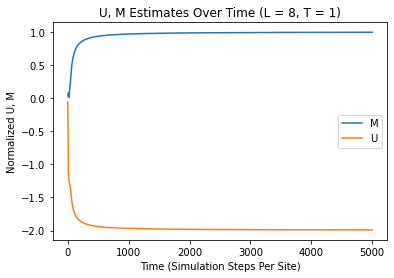

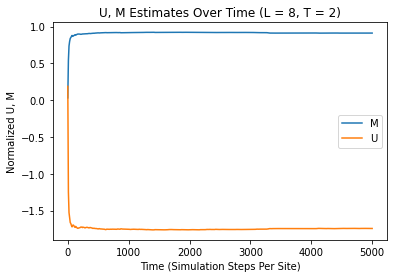

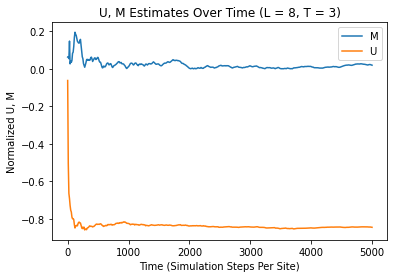

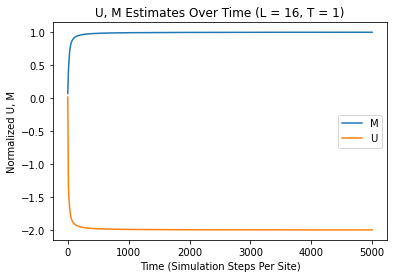

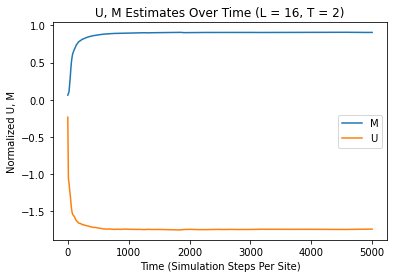

...

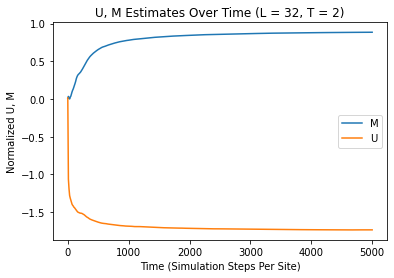

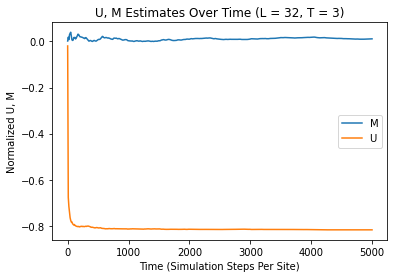

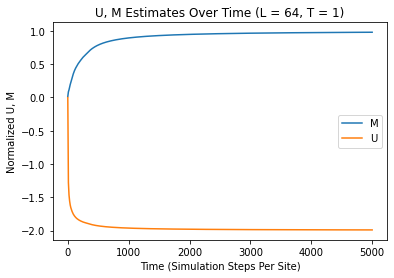

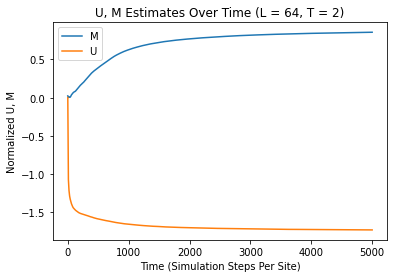

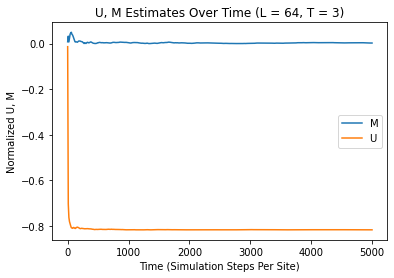

In [ ]:
# test constants
tempRange = [1, 2, 3]
lRange = [8, 16, 32, 64]
maxTime = int(5000)

for L in lRange:
  for temp in tempRange:
    # simulate
    T, U, M, _, _ = two_dim_ising(L, temp, maxTime * L**2, debug = L >= 32) # print progress logs if L is too big, because that's when computation starts to take quite a while
    clearLogs()

    # plot results
    plt.plot(T, M, label="M")
    plt.plot(T, U, label="U")

    plt.title("U, M Estimates Over Time (L = " + str(L) + ", T = " + str(temp) + ")")
    plt.xlabel("Time (Simulation Steps Per Site)")
    plt.ylabel("Normalized U, M")
    
    plt.legend()
    plt.show()

### Testing Magnetization Dependence on Temperature

Next, we will plot the converged magnetizations of four systems (L = 8, 16, 32, and 64) as we adjust the temperature of the simulation. In the same figure, we will plot the magnetization predicted by Onsager's exact solution:

\begin{align}
M(T) = \begin{cases} (1 - \sinh^{-4}(\frac{2}{T}))^{\frac{1}{8}},& T < T_c\\
0,& T \geq T_c
\end{cases}
\end{align}

The script below will create these plots by initializing each of these systems at a temperature of 10, then lowering the temperature of the system in increments of 0.2 until the temperature of 0.2, simulating for 1000 time units for each setting. Only the last 500 time units will be included in the measurement of each datapoint.

Rather than using the two_dim_ising() function from earlier, which has a rather specific use case, the script below will operate directly on my custom Ising2D class, which stores the state of the system, allowing state variables to be altered throughout the simulation.

From the plot, we can easily see that below the critical temperature, all models have magnetizations approaching 1 in the same manner as the exact solution. However, at temperatures greater than the critical temperature, though the magnetizations are centered around 0, they are extremely noisy. The most eratic and innacurate magnetizations occur with lower values of L. The L = 8 model errs quite far from the correct magnetization (M = 0), whereas the L = 64 model stays much closer to 0.

This appears to be a trend with this simulation: at temperatures close to but higher than the critical temperature, magnetization takes an extremely long time to stabilize, and drifts over time.

This noisiness with lower L is once again likely due to the lower resolution of the Ising systems. With lower L, random fluctuations in any particular spin affect a larger fraction of the whole system, and have a much larger effect on magnetization.

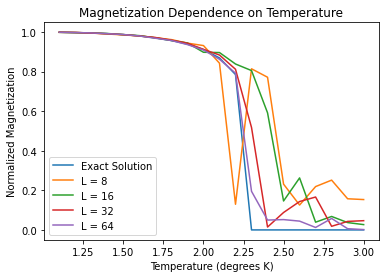

In [ ]:
timeUntilEquilib = 10000
measurementTime = 200
initialTemp = 3
minTemp = 1

tempRange = list(np.arange(initialTemp, minTemp, -0.1))
L_range = [8, 16, 32, 64]

# create initial states for each L setting
state = {}
for L in L_range:
  state[L] = Ising2D(L, initialTemp)

# create lists to save data
equilib_M = {}
for L in L_range:
  equilib_M[L] = []

for temp in tempRange:
  for L in L_range:
    # log progress
    if True:
      clearLogs()
      log("Simulating: L = " + str(L) + ", T = " + str(temp))
      
    # erase accumulated measurements
    state[L].resetAverages()

    # update temperature
    state[L].updateTemp(temp)

    # don't record time series while waiting for equilibrium
    state[L].updateRecordRate(None)

    # simulate until thermal equilibrium - not saving measurements
    state[L].simulateRepeating(timeUntilEquilib * L**2, debug= L >= 32)



    # erase accumulated averages and measurements
    state[L].resetAverages()

    # set record rate to default
    state[L].updateRecordRate(1)

    # simulate again
    state[L].simulateRepeating(measurementTime * L**2)



    # save resulting final magnetization into list
    equilib_M[L].append(state[L].M[-1])

    '''
    # TEMPORARY DEBUG - show M graph (this should be stable value since it should have converged)
    plt.plot(state[L].T, state[L].M)
    plt.title("L = " + str(L) + ", T = " + str(temp))
    plt.show()
    state[L].resetAverages()
    '''

# create list for plotting exact solution
exact_M = [(1 - math.sinh(2 / temp)**-4)**(1/8) if temp < 2.2692 else 0 for temp in tempRange]

# clear logs
clearLogs()

# plot results
plt.plot(tempRange, exact_M, label="Exact Solution")
for L in L_range:
  plt.plot(tempRange, equilib_M[L], label="L = " + str(L))

plt.title("Magnetization Dependence on Temperature")
plt.xlabel("Temperature (degrees K)")
plt.ylabel("Normalized Magnetization")
plt.legend()

plt.show()

### Picturing Spin Configurations at Different Temperatures

The script below will run three Ising models with L = 256 for 500 time units. The models will experience temperatures of 1.8, 2.3, and 4.0 respectively.

The script below creates these three Ising models at the three temperatures, and simulates them for the specified time before displaying the final spin configuration of each as a bitmap. Since these simulations take so long (4+ hours per temperature), I have separated the script into separate cells, allowing the script to be more modular, and saving as much work as possible if the simulation is interrupted during execution.

For each temperature, I display four different things: The final spin configuration, the magnetization over time, an animation of the spin configuration across the entire simulation period, and a montage of frames, displaying the same data as the animation in a pdf-friendly form.

I included this extra output in my efforts to understand why my Ising model magnetizations were taking so long to converge, and tended to drift over time, especially for temperatures near the critical temperature.

It's clear from these animations the qualitative difference that occurs across the critical temperature. At all temperatures (while H = 0), if a spin site is targeted which has at least two neighboring sites of the opposite spin, it is guaranteed to switch spins. This effect leads to borders that have a tendency to expand. The interesting factor directly related to temperature is the chance for spin sites which are surrounded by three or more same-spin sites to flip, disrupting regions which would otherwise be stable.
\
\
\
Above the critical temperature (T = 4.0), the chances of a spin flipping are:

\begin{align}
P(\textrm{flip | 3 neighbors with same spin}) = e^{\frac{-4}{4}} = e^{-1} = 0.368\\
P(\textrm{flip | 4 neighbors with same spin}) = e^{\frac{-8}{4}} = e^-2 = 0.135
\end{align}

In this domain, the state's evolution simply looks like white noise. Evidently, these probabilities are too high for regions of uniform spin to be stable. Though spins are less likely to flip when surrounded by sites with the same spin, the Boltzmann factor is large enough that it's bound to occur often.
\
\
\
Slightly above the critical temperature (T = 2.3), the chances of a spin flipping are:

\begin{align}
P(\textrm{flip | 3 neighbors with same spin}) = e^{\frac{-4}{2.3}} = e^{-1.739} = 0.176\\
P(\textrm{flip | 4 neighbors with same spin}) = e^{\frac{-8}{2.3}} = e^{-3.478} = 0.0309
\end{align}

It seems that the probability of flipping when surrounded by sites of the same spin is low enough to be very uncommon. On the other hand, the temperature is still high enough that spin sites surrounded by a mix of spins will commonly switch signs. The combination of these effects leads to a state made up of noisy unstable regions of common spin. Though the internal areas of these regions are relatively stable, the edges of these regions are very much not stable. The edges move constantly, and are full of holes, further increasing the amount of lattice sites which are effectively 'on an edge.'
\
\
\
Below the critical temperature (T = 1.8), however, the chances of a spin flipping are:

\begin{align}
P(\textrm{flip | 3 neighbors with same spin}) = e^{\frac{-4}{1.8}} = e^{-2.222} = 0.108\\
P(\textrm{flip | 4 neighbors with same spin}) = e^{\frac{-8}{1.8}} = e^{-4.444} = 0.0117
\end{align}

The chances of flipping within a solid region (surrounded by sites with the same spin) are low enough that regions are internally stable. From the animation, we can see that the chances of flipping when surrounded by three same-spin sites are low enough that the borders of solid regions grow over time, and don't average to a near zero value. In this regime, we see two large solid regions of spin competing against one another to grow, and this seems to slow down the time to converge considerably. The magnetization seems to be on a linear trajectory upwards from 3000 time units all the way to the end of the simulated period. It seems likely that over time a single spin region would come to dominate most of the state, resulting in a magnetization value near one.

In [ ]:
# create dictionaries to store results
# resets any progress from previous simulations
models = {}
frames = {}
completeModels = set() # stores temperatures for which the simulation has been completed

In [ ]:
simulationDuration = 10000
L = 256
tempRange = [1.8, 2.3, 4.0]

# montage constants
numFrames = 25
numColumns = 5

for temp in tempRange:
  # don't recompute already completed models
  if temp in completeModels:
    print("Model (T = " + str(temp) + ") already completed.")
    continue

  
  # create model
  models[temp] = Ising2D(L, temp, recordRate=simulationDuration // numFrames // 2 * L**2) # record measurables twice per frame

  # create list to store frames
  frames[temp] = []

  # get 25 equally spaced frames (montage of state evolution)
  for segment in range(numFrames):
    # progress log
    log("(T = " + str(temp) + ") - Segment " + str(segment + 1) + " / " + str(numFrames), id="outer_loop")

    # simulate model
    models[temp].simulateRepeating(simulationDuration // numFrames * L**2, True)

    # clear log output
    clearLogs("outer_loop")
    clearLogs()

    # save frame for montage
    frames[temp].append(np.copy(models[temp].state))

  # mark completion
  completeModels.add(temp)
  print("Model (T = " + str(temp) + ") finished.")

Model (T = 1.8) already completed.
Model (T = 2.3) finished.
Model (T = 4.0) finished.


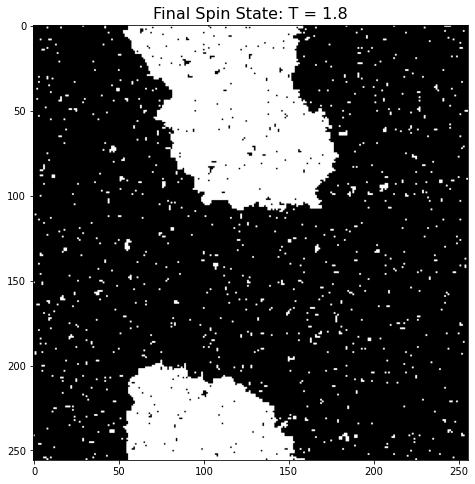

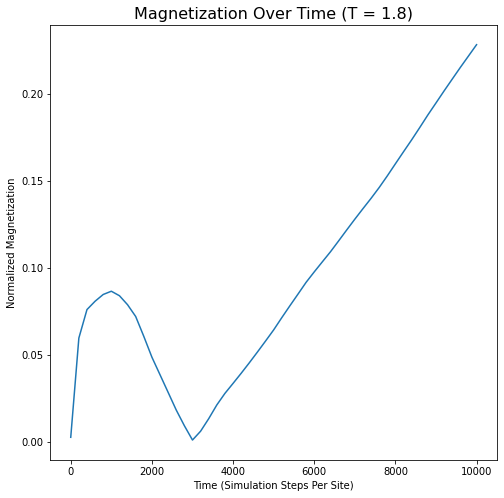

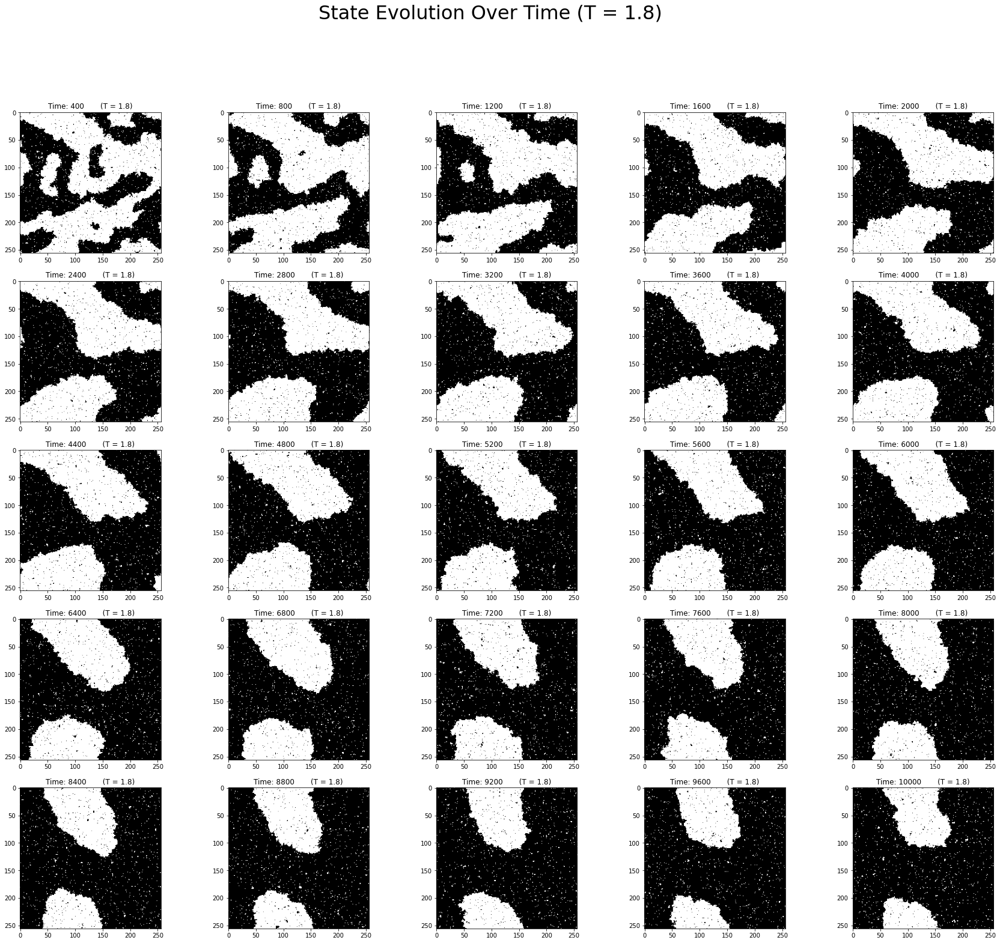

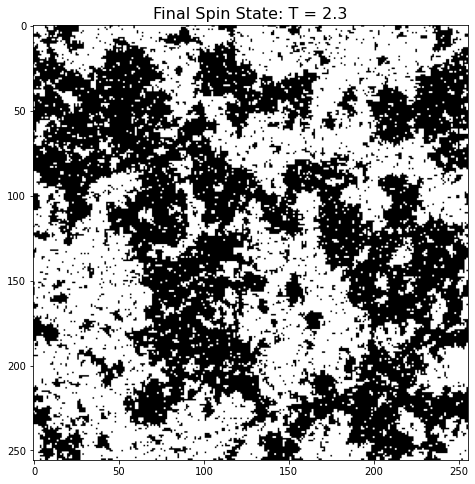

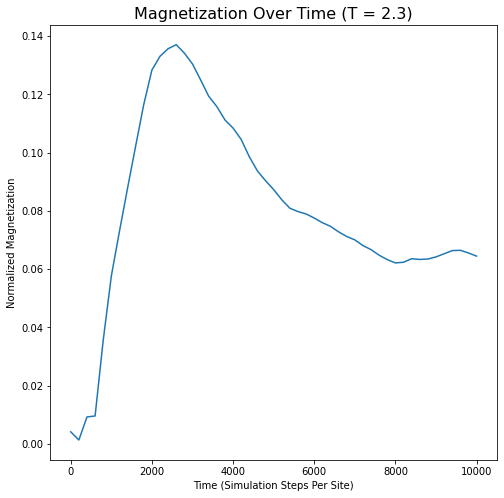

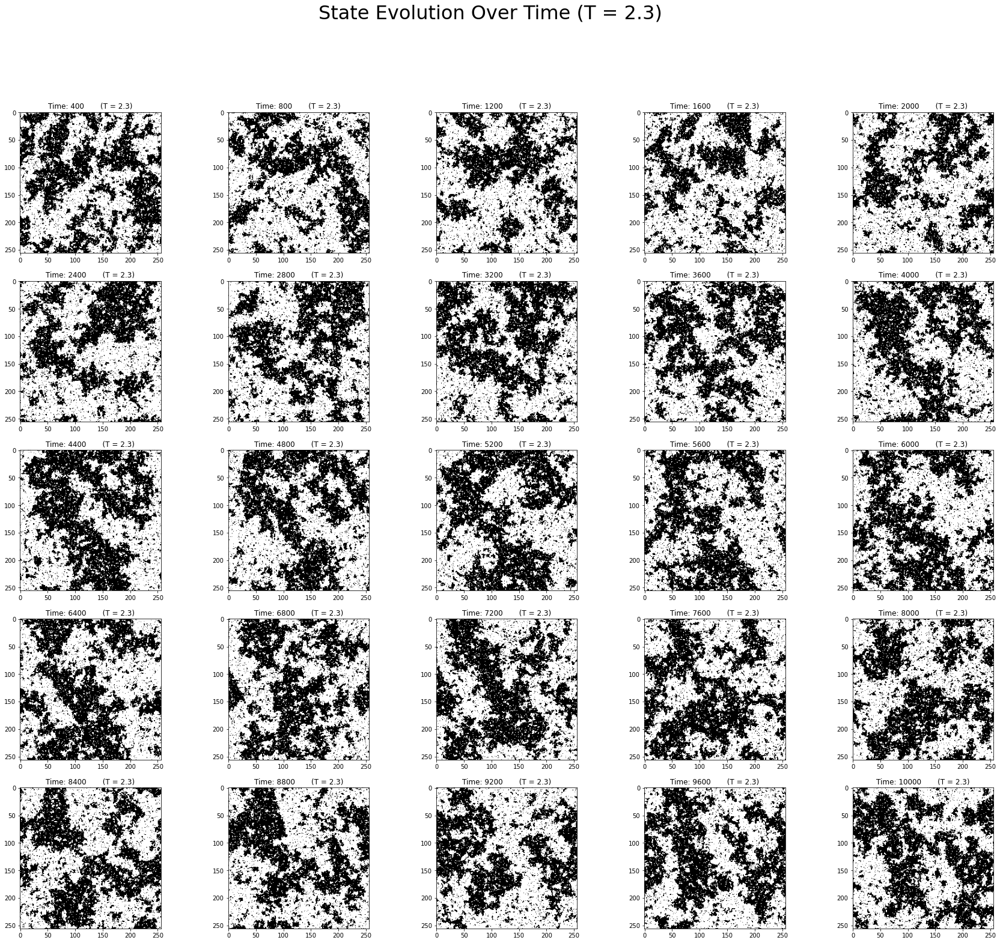

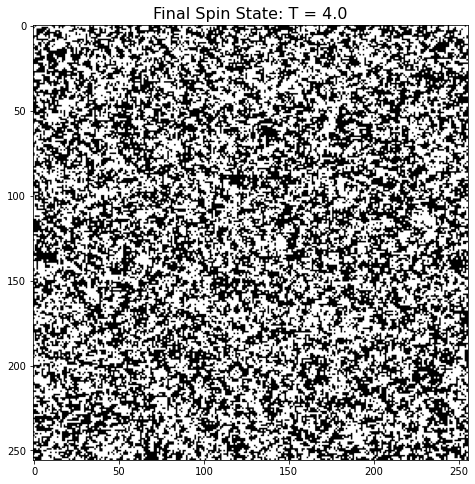

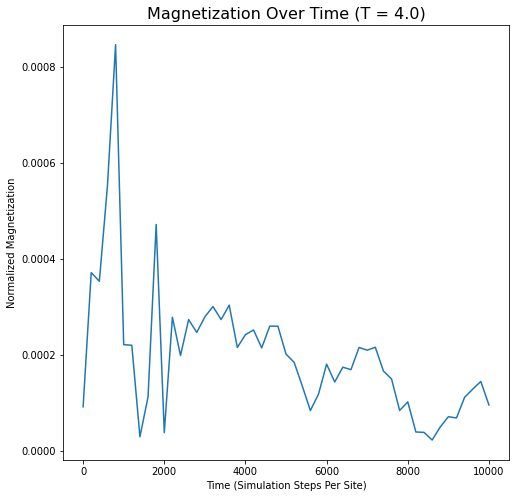

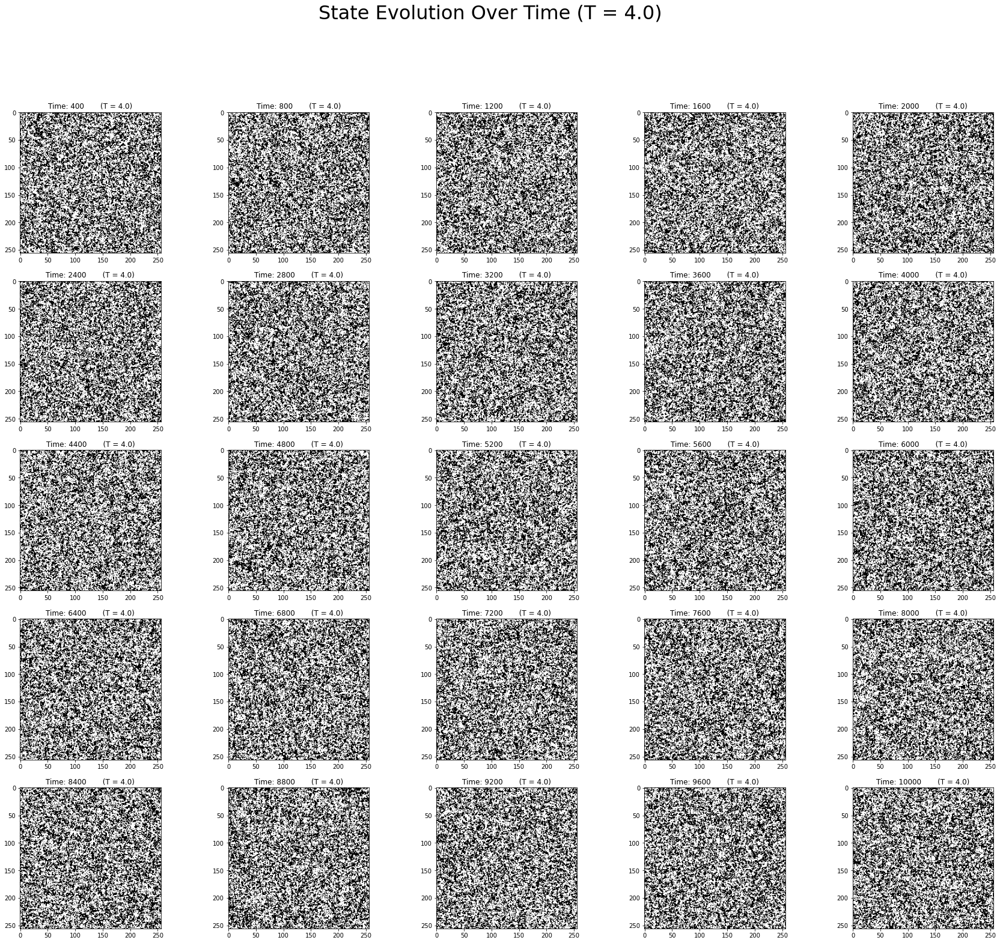

In [ ]:
# plot results
%matplotlib inline

for temp in completeModels:
  # plot final state configurations
  fig = plt.figure(figsize=(8, 8))
  plt.imshow(models[temp].state, cmap='Greys')
  plt.title("Final Spin State: T = " + str(temp), size=16)
  plt.show()

  # plot magnetization over time to ensure convergence
  fig = plt.figure(figsize=(8, 8))
  plt.plot(models[temp].T, models[temp].M)
  plt.title("Magnetization Over Time (T = " + str(temp) + ")", size=16)
  plt.xlabel("Time (Simulation Steps Per Site)")
  plt.ylabel("Normalized Magnetization")
  plt.show()

  # animate state evolution over time
  animate(frames[temp], "State Evolution Over Time (T = " + str(temp) + ")")

  # create montage of state evolution over time
  fig = plt.figure(figsize=(30, 25))
  plt.suptitle("State Evolution Over Time (T = " + str(temp) + ")", size=32)

  for i, frame in enumerate(frames[temp]):
    plt.subplot(math.ceil(numFrames / numColumns), numColumns, i + 1)
    plt.imshow(frame, cmap='Greys')
    plt.title("Time: " + str(int((i + 1) / numFrames * simulationDuration)) + "       (T = " + str(temp) + ")")